In [ ]:
!pip install category_encoders

     |████████████████████████████████| 82 kB 479 kB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Angraj project dmkd/01. bank-additional-full.csv', sep=";")

#Check number of rows and columns in the dataset

In [ ]:
df.shape

(41188, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

Dataset Preprocessing

In [ ]:
pre_df = df.copy()
pre_df.drop(['contact','month','day_of_week','default','pdays','duration'],axis=1,inplace=True)
pre_df.head(5)

,age,job,marital,education,housing,loan,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,no,no,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,yes,no,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,yes,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
import category_encoders as ce


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
encoder = ce.OrdinalEncoder(cols=['age', 'job', 'marital', 'education', 'housing', 'loan','poutcome'])

pre_df = encoder.fit_transform(pre_df)

In [ ]:
pre_df.head(5)

,age,job,marital,education,housing,loan,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,1,1,1,1,1,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,2,2,1,2,1,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,3,2,1,2,2,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,4,3,1,3,1,1,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,1,2,1,2,1,2,1,0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [ ]:
pre_df["y"] = pre_df["y"].apply(lambda x: 0 if x=="no" else 1)

Preparing dataset to be fed into Model

In [ ]:
X = pre_df.drop(['y'], axis=1)

y = pre_df['y']

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.05, random_state = 42)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(39128, 14)
(39128,)
(2060, 14)
(2060,)


In [ ]:
X_train.head()

,age,job,marital,education,housing,loan,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
28381,31,5,2,7,1,1,1,0,1,-1.8,93.075,-47.1,1.435,5099.1
4615,21,6,1,7,1,1,2,0,1,1.1,93.994,-36.4,4.856,5191.0
25889,33,3,3,7,1,1,1,0,1,-0.1,93.200,-42.0,4.120,5195.8
38448,41,12,2,2,2,1,1,0,1,-3.4,92.431,-26.9,0.730,5017.5
24018,6,4,1,5,1,1,1,0,1,-0.1,93.798,-40.4,4.968,5195.8


Decision Tree - CART

Measures for selecting the Best Split

GINI

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
clf_gini = DecisionTreeClassifier(max_depth=11, random_state=42)

# fit the model
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=11, random_state=42)

In [ ]:
# Getting some predictions from the testing set
y_pred_gini = clf_gini.predict(X_test)

In [ ]:
# Finding the testing accuracy of the model
from sklearn.metrics import accuracy_score

print('Test accuracy score with criterion gini index: {0:0.4f}'. format(accuracy_score(y_test, y_pred_gini)))

Test accuracy score with criterion gini index: 0.8942


In [ ]:
# Finding the training accuracy of the model
y_pred_train_gini = clf_gini.predict(X_train)

y_pred_train_gini

array([0, 0, 0, ..., 1, 0, 0])

In [ ]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train_gini)))

Training-set accuracy score: 0.9156


In [ ]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9156
Test set score: 0.8942


max depth=5
Training set score: 0.9011
Test set score: 0.8956

max depth =7
Training set score: 0.9034
Test set score: 0.8956

max depth =9
Training set score: 0.9081
Test set score: 0.8947

max depth=11
Training set score: 0.9156
Test set score: 0.894

entropy

In [ ]:
clf_entropy = DecisionTreeClassifier(criterion="entropy",max_depth=20, random_state=42)

# fit the model
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=42)

In [ ]:
# Getting some predictions from the testing set
y_pred_entropy = clf_entropy.predict(X_test)

In [ ]:
# Finding the testing accuracy of the model
from sklearn.metrics import accuracy_score

print('Test accuracy score with criterion entropy index: {0:0.4f}'. format(accuracy_score(y_test, y_pred_entropy)))

Test accuracy score with criterion entropy index: 0.8660


In [ ]:
# Finding the training accuracy of the model
y_pred_train_entropy = clf_entropy.predict(X_train)

y_pred_train_entropy

array([0, 0, 0, ..., 1, 0, 0])

In [ ]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train_entropy)))

Training-set accuracy score: 0.9536


In [ ]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_entropy.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_entropy.score(X_test, y_test)))

Training set score: 0.9536
Test set score: 0.8660


max depth-=4
Training set score: 0.9002
Test set score: 0.8971

max depth=6
Training set score: 0.9021
Test set score: 0.8961

max depth=7
Training set score: 0.9033
Test set score: 0.8992

max depth=9
Training set score: 0.9068
Test set score: 0.8976

max depth=20
Training set score: 0.9002
Test set score: 0.8971

plotting the splits

GINI

[Text(0.5359968932748538, 0.9583333333333334, 'X[13] <= 5087.65\ngini = 0.2\nsamples = 39128\nvalue = [34725, 4403]'),
 Text(0.30904148391812863, 0.875, 'X[8] <= 2.5\ngini = 0.494\nsamples = 4716\nvalue = [2619, 2097]'),
 Text(0.149890350877193, 0.7916666666666666, 'X[12] <= 0.715\ngini = 0.464\nsamples = 3665\nvalue = [2326, 1339]'),
 Text(0.0720029239766082, 0.7083333333333334, 'X[8] <= 1.5\ngini = 0.497\nsamples = 691\nvalue = [374, 317]'),
 Text(0.03713450292397661, 0.625, 'X[1] <= 3.5\ngini = 0.499\nsamples = 416\nvalue = [201, 215]'),
 Text(0.018421052631578946, 0.5416666666666666, 'X[6] <= 6.5\ngini = 0.478\nsamples = 154\nvalue = [61, 93]'),
 Text(0.017251461988304094, 0.4583333333333333, 'X[12] <= 0.704\ngini = 0.471\nsamples = 150\nvalue = [57, 93]'),
 Text(0.009941520467836258, 0.375, 'X[12] <= 0.691\ngini = 0.447\nsamples = 101\nvalue = [34, 67]'),
 Text(0.005847953216374269, 0.2916666666666667, 'X[12] <= 0.685\ngini = 0.468\nsamples = 83\nvalue = [31, 52]'),
 Text(0.004678

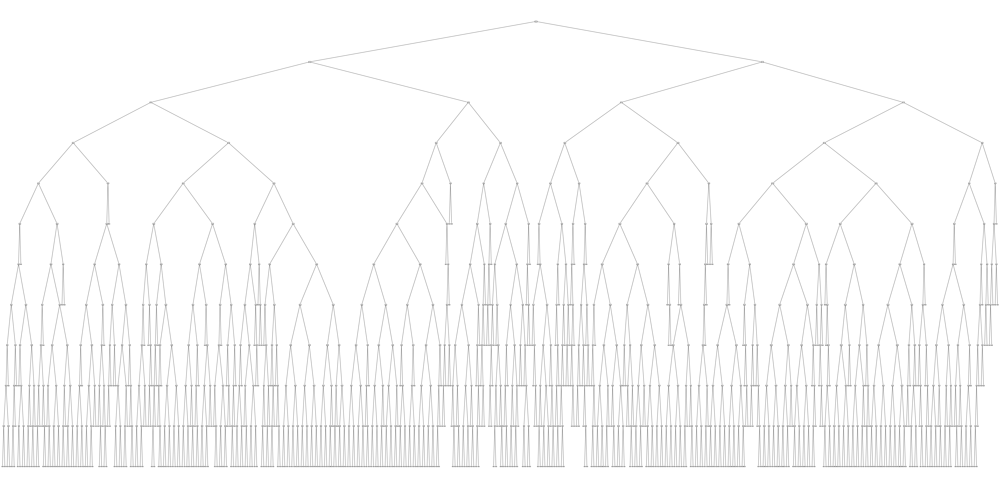

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(96,48))

from sklearn import tree

tree.plot_tree(clf_gini.fit(X_train, y_train)) 

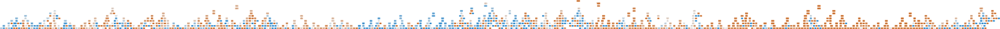

In [ ]:
import graphviz 
dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=str(y_train),  
                              filled=True, rounded=True,
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph

In [ ]:
graph.render(filename='CART_gini.dot',directory='/content/drive/MyDrive/CSI 382 - Datasets/')

'/content/drive/MyDrive/CSI 382 - Datasets/CART_gini.dot.pdf'

entropy

[Text(0.38686397017864843, 0.9761904761904762, 'X[13] <= 5087.65\nentropy = 0.507\nsamples = 39128\nvalue = [34725, 4403]'),
 Text(0.1868043164525345, 0.9285714285714286, 'X[8] <= 2.5\nentropy = 0.991\nsamples = 4716\nvalue = [2619, 2097]'),
 Text(0.07373537125371575, 0.8809523809523809, 'X[12] <= 0.715\nentropy = 0.947\nsamples = 3665\nvalue = [2326, 1339]'),
 Text(0.035575084189082444, 0.8333333333333334, 'X[8] <= 1.5\nentropy = 0.995\nsamples = 691\nvalue = [374, 317]'),
 Text(0.01646234357460608, 0.7857142857142857, 'X[1] <= 3.5\nentropy = 0.999\nsamples = 416\nvalue = [201, 215]'),
 Text(0.010227414459734753, 0.7380952380952381, 'X[6] <= 6.5\nentropy = 0.969\nsamples = 154\nvalue = [61, 93]'),
 Text(0.009894815615515737, 0.6904761904761905, 'X[12] <= 0.701\nentropy = 0.958\nsamples = 150\nvalue = [57, 93]'),
 Text(0.005986779195942294, 0.6428571428571429, 'X[12] <= 0.691\nentropy = 0.918\nsamples = 96\nvalue = [32, 64]'),
 Text(0.005321581507504261, 0.5952380952380952, 'X[12] <= 0

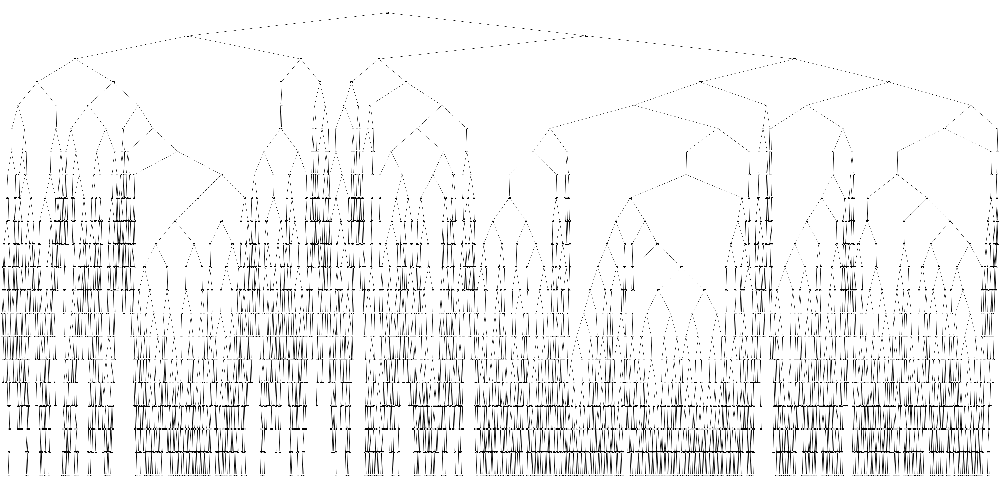

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(96,48))

from sklearn import tree

tree.plot_tree(clf_entropy.fit(X_train, y_train)) 

In [ ]:
import graphviz 
dot_data = tree.export_graphviz(clf_entropy, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=str(y_train),  
                              filled=True, rounded=True,
                              special_characters=True)

graph1 = graphviz.Source(dot_data) 

graph1 

In [ ]:
graph1.render(filename='CART_entropy.dot',directory='/content/drive/MyDrive/CSI 382 - Datasets/')

'/content/drive/MyDrive/CSI 382 - Datasets/CART_entropy.dot.pdf'

Evaluating the Model - CART

Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_gini)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[1788   35]
 [ 183   54]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


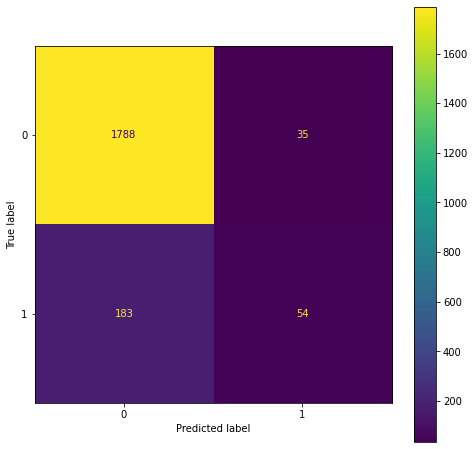

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots

fig, ax = plt.subplots(figsize=(8, 8))

plot_confusion_matrix(clf_gini, X_test, y_test, values_format='.0f', ax=ax)  

plt.savefig('/content/drive/MyDrive/CSI 382 - Datasets/cart_gini_confusion_matrix.png')

entropy

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_entropy)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[1715  108]
 [ 168   69]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


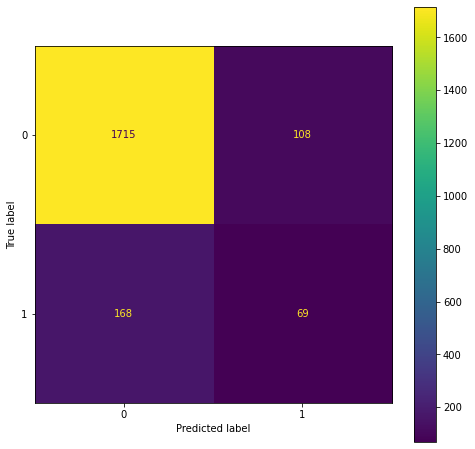

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots

fig, ax = plt.subplots(figsize=(8, 8))

plot_confusion_matrix(clf_entropy, X_test, y_test, values_format='.0f', ax=ax)  

plt.savefig('/content/drive/MyDrive/CSI 382 - Datasets/cart_entropy_confusion_matrix.png')

Support and Confidence

gini

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      1823
           1       0.61      0.23      0.33       237

    accuracy                           0.89      2060
   macro avg       0.76      0.60      0.64      2060
weighted avg       0.87      0.89      0.87      2060



entropy

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_entropy))

              precision    recall  f1-score   support

           0       0.91      0.94      0.93      1823
           1       0.39      0.29      0.33       237

    accuracy                           0.87      2060
   macro avg       0.65      0.62      0.63      2060
weighted avg       0.85      0.87      0.86      2060



Decision Tree - C4.5

In [ ]:
# setting maximum depth of the decision tree to be level 3 with randomly chosen samples in the training set
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

# fit the model
clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

In [ ]:
# Getting some predictions from the testing set
y_pred_en = clf_en.predict(X_test)

In [ ]:
# Getting some predictions from the training set
y_pred_train_en = clf_en.predict(X_train)

y_pred_train_en

array([0, 0, 0, ..., 1, 0, 0])

In [ ]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train_en)))

Training-set accuracy score: 0.8994


In [ ]:
print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.8994
Test set score: 0.8976


[Text(0.5, 0.875, 'X[13] <= 5087.65\nentropy = 0.507\nsamples = 39128\nvalue = [34725, 4403]'),
 Text(0.25, 0.625, 'X[8] <= 2.5\nentropy = 0.991\nsamples = 4716\nvalue = [2619, 2097]'),
 Text(0.125, 0.375, 'X[12] <= 0.715\nentropy = 0.947\nsamples = 3665\nvalue = [2326, 1339]'),
 Text(0.0625, 0.125, 'entropy = 0.995\nsamples = 691\nvalue = [374, 317]'),
 Text(0.1875, 0.125, 'entropy = 0.928\nsamples = 2974\nvalue = [1952, 1022]'),
 Text(0.375, 0.375, 'X[13] <= 5020.5\nentropy = 0.854\nsamples = 1051\nvalue = [293, 758]'),
 Text(0.3125, 0.125, 'entropy = 0.803\nsamples = 808\nvalue = [198, 610]'),
 Text(0.4375, 0.125, 'entropy = 0.965\nsamples = 243\nvalue = [95, 148]'),
 Text(0.75, 0.625, 'X[11] <= -46.65\nentropy = 0.355\nsamples = 34412\nvalue = [32106, 2306]'),
 Text(0.625, 0.375, 'X[12] <= 1.368\nentropy = 0.742\nsamples = 2595\nvalue = [2050, 545]'),
 Text(0.5625, 0.125, 'entropy = 0.992\nsamples = 290\nvalue = [160, 130]'),
 Text(0.6875, 0.125, 'entropy = 0.68\nsamples = 2305\nva

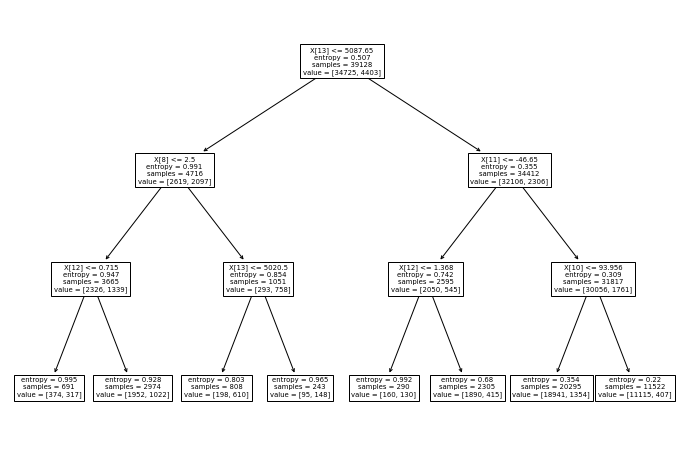

In [ ]:
plt.figure(figsize=(12,8))

from sklearn import tree

tree.plot_tree(clf_en.fit(X_train, y_train))

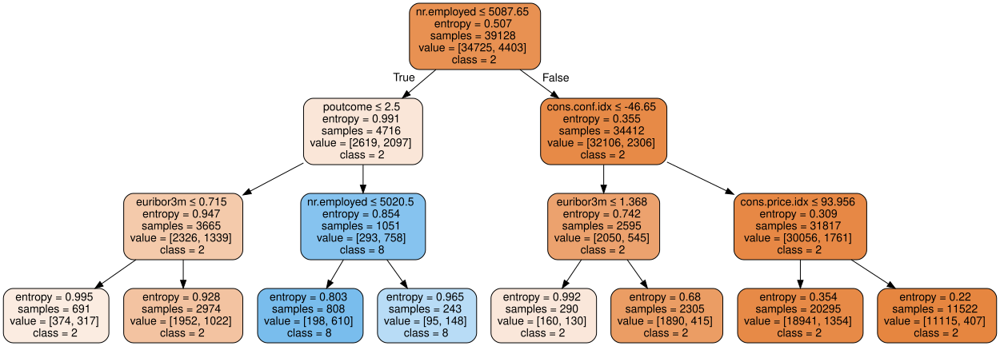

In [ ]:
import graphviz 
dot_data = tree.export_graphviz(clf_en, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=str(y_train),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph2 = graphviz.Source(dot_data) 

graph2

In [ ]:
graph2.render(filename='C4.5.dot',directory='/content/drive/MyDrive/CSI 382 - Datasets/')

'/content/drive/MyDrive/CSI 382 - Datasets/C4.5.dot.pdf'

Evaluating the model - C4.5

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_en)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[1803   20]
 [ 191   46]]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


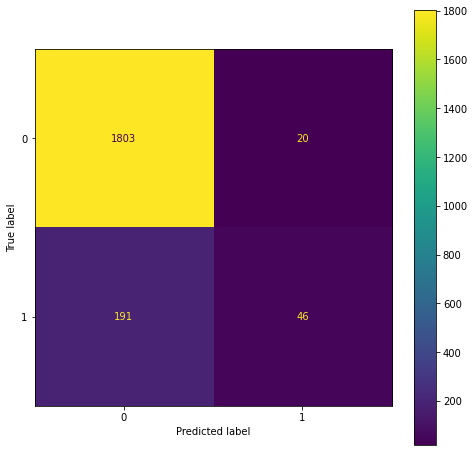

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots

fig, ax = plt.subplots(figsize=(8, 8))

plot_confusion_matrix(clf_en, X_test, y_test, values_format='.0f', ax=ax)  

plt.savefig('/content/drive/MyDrive/CSI 382 - Datasets/c4.5_confusion_matrix.png')

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_en))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      1823
           1       0.70      0.19      0.30       237

    accuracy                           0.90      2060
   macro avg       0.80      0.59      0.62      2060
weighted avg       0.88      0.90      0.87      2060

